In [14]:
%load_ext autoreload
%autoreload 2

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.ticker import FormatStrFormatter
import matplotlib.gridspec as gridspec
import seaborn as sns

from gwbird import detectors
from gwbird.detectors import Observatories
from gwbird.skymap import Basis, Skymaps
from gwbird import pls
from gwbird import snr
from gwbird.overlap import Response
from gwbird.nell import AngularResponse, Sensitivity_ell
from gwbird import nell
from gwbird.NANOGrav import NANOGrav_dir
from pint.models import get_model
import glob, os 
from gwbird.utils import c, H0, h
import beepy

%config InlineBackend.figure_format = 'retina'

sns.set_palette("husl")
plt.rcParams['figure.dpi'] = 300
plt.rcParams['font.size'] = 20
plt.rcParams['axes.labelsize'] = 20
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
plt.rcParams['legend.fontsize'] = 20
plt.rcParams['lines.linewidth'] = 3
plt.rcParams['font.family'] = 'serif'

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


MovieWriter imagemagick unavailable; using Pillow instead.


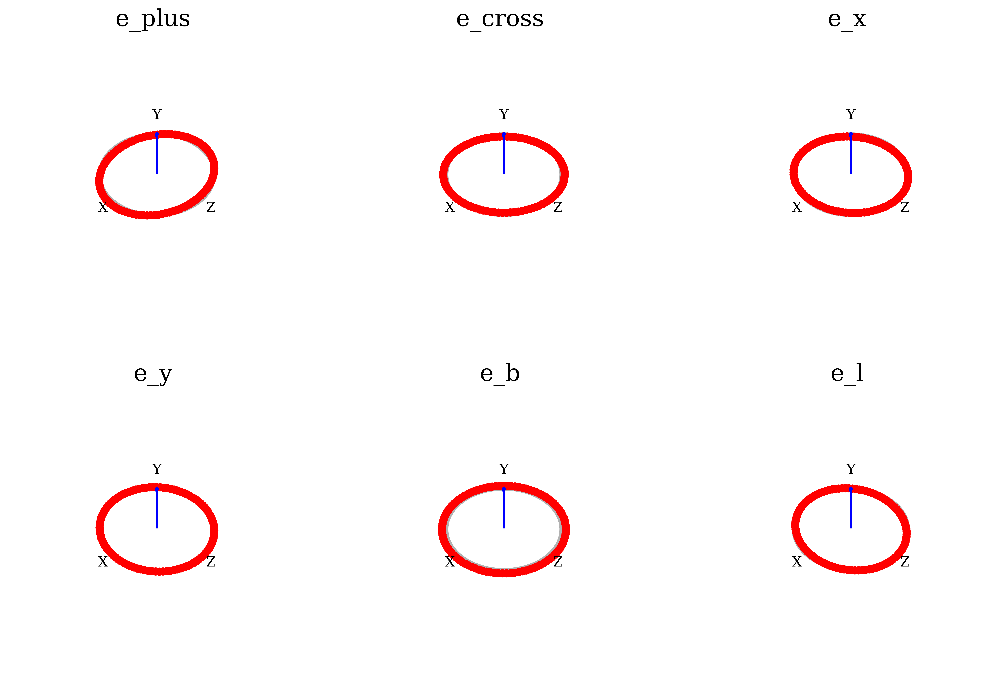

In [35]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from mpl_toolkits.mplot3d import Axes3D

# Definizione della griglia di punti su un anello
num_points = 100
angles = np.linspace(0, 2 * np.pi, num_points)
ring_x = np.cos(angles)
ring_y = np.sin(angles)
ring_z = np.zeros_like(ring_x)  # Piano XY
ring_points = np.vstack((ring_x, ring_y, ring_z))  # Matrice 3xN dei punti

polarizations = ['e_plus', 'e_cross', 'e_x', 'e_y', 'e_b', 'e_l']
fig, axes = plt.subplots(2, 3, subplot_kw={'projection': '3d'}, figsize=(15, 10))
axes = axes.flatten()
plots = []

# Inizializza i sei plot
# Inizializza i sei plot
# Inizializza i sei plot
for ax, pol in zip(axes, polarizations):
    ax.set_xlim(-1.5, 1.5)
    ax.set_ylim(-1.5, 1.5)
    ax.set_zlim(-1.5, 1.5)
    ax.set_title(pol)
    ax.set_box_aspect([1, 1, 1])
    ax.grid(True)
    ax.plot(ring_x, ring_y, ring_z, 'k-', alpha=0.3)  # Disegna l'anello di riferimento
    plot, = ax.plot(ring_x, ring_y, ring_z, 'ro')
    plots.append(plot)

    # Ruotiamo la vista per una visualizzazione diagonale
    ax.view_init(elev=45, azim=45)  # Cambiato per inclinare la vista

    # Aggiungiamo la freccia per la direzione di propagazione
    # La freccia va dalla posizione (0, 0, 0) nella direzione dell'asse z (o qualsiasi altra direzione)
    ax.quiver(0, 0, 0, 0, 0, 1, color='blue', linewidth=2, arrow_length_ratio=0.1)  # Freccia lungo z

    # Rimuoviamo gli assi
    ax.set_axis_off()

    # Aggiungiamo le etichette X, Y, Z centrato nei cerchi
    ax.text(0, 1.3, 0, 'Z', color='black', fontsize=12, ha='center')
    ax.text(1.3, 0, 0, 'X', color='black', fontsize=12, ha='center')
    ax.text(0, 0, 1.3, 'Y', color='black', fontsize=12, ha='center')


# Funzione per aggiornare la posizione dei punti durante l'animazione
def update(frame):
    t = frame / 10.0  # Tempo normalizzato
    amp = 0.1  # Ampiezza della deformazione
    
    # Definizione delle polarizzazioni
    e_plus = np.array([[1, 0, 0], [0, -1, 0], [0, 0, 0]]) * np.cos(2 * np.pi * t)
    e_cross = np.array([[0, 1, 0], [1, 0, 0], [0, 0, 0]]) * np.sin(2 * np.pi * t)
    e_x = np.array([[0, 0, 1], [0, 0, 0], [1, 0, 0]]) * np.cos(2 * np.pi * t)
    e_y = np.array([[0, 0, 0], [0, 0, 1], [0, 1, 0]]) * np.sin(2 * np.pi * t)
    e_b = np.array([[1, 0, 0], [0, 1, 0], [0, 0, 0]]) * np.cos(2 * np.pi * t)
    e_l = np.array([[1, 0, 0], [0, 0, 1], [0, 1, 0]]) * np.sin(2 * np.pi * t)  # Corretto
    
    tensors = [e_plus, e_cross, e_x, e_y, e_b, e_l]
    
    for plot, tensor in zip(plots, tensors):
        deformed = ring_points + amp * (tensor @ ring_points)
        plot.set_data(deformed[0, :], deformed[1, :])
        plot.set_3d_properties(deformed[2, :])
    
    return plots

# Creazione dell'animazione
ani = animation.FuncAnimation(fig, update, frames=100, interval=50)

# Salvataggio come GIF
ani.save('polarization_ring_rotated.gif', writer='imagemagick', fps=30)

plt.show()




# Antenna Pattern maps

Antenna pattern function: detector response to an incoming GW signal

Parameters:

- det1, det2: str or list of str
    The name of the detector(s) to consider.
    The names must be in the list of detectors available.
    The list of available detectors can be obtained by calling the function detectors.available_detectors().
    The names of the detectors are case sensitive.
    If you want to provide a custom detector, you can provide the following information in a list:

    H = [c, xA, xB, l, name]

    - c: array_like of length 3 (Position of the detector in the Earth-centered frame in meters)
    - xA: array_like of length 3 (Unit vector pointing towards the detector in the Earth-centered frame)
    - xB: array_like of length 3 (Unit vector pointing towards the detector in the Earth-centered frame)
    - l: float (Length of the arm in meters)
    - name: str (Name of the detector)

- f: frequency array

- psi: polarization angle in [0, pi]

- pol: polarization type: 't', 'v', 's', 'I', 'V'

- nside: int, optional\
    The nside parameter for the healpy function. Default is 32.

- shift_angle: float, optional\
    The separation angle between ET L Sardinia - ET L The Netherlands. Default is None.

Returns:
overlap_map: overlap map, array of shape (npix,)


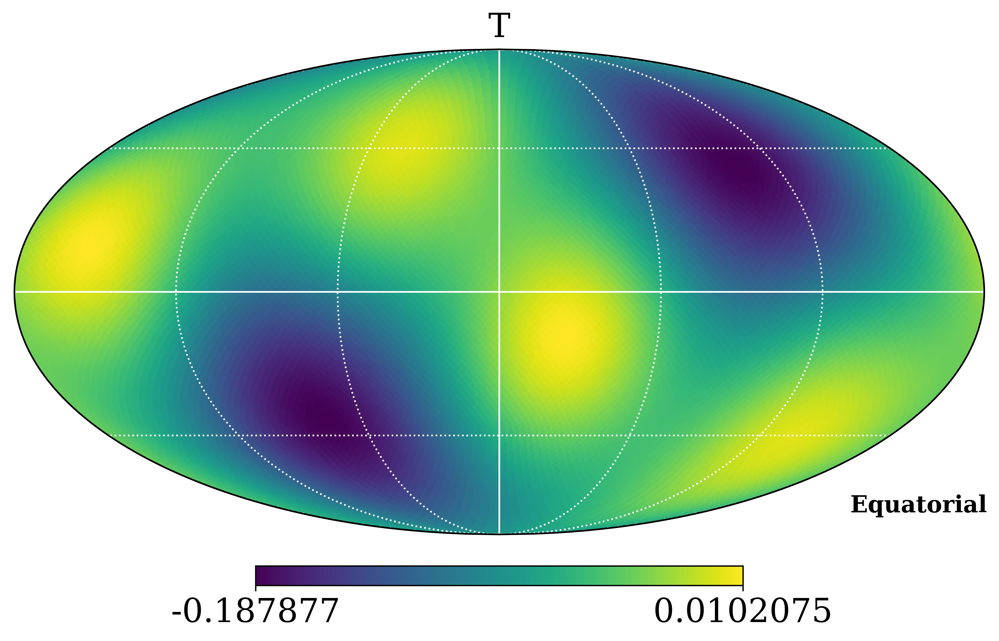

In [36]:
mapHL = Skymaps.AntennaPattern('LIGO H', 'LIGO L', 10, 0, 't')
beepy.beep(sound=1) 

# Overlap reduction function

## Ground Based Detectors


Calculate the overlap response between two detectors.

R = Response.overlap(det1, det2, f, psi, pol, shift_angle=False)

Parameters:
- det1, det2: str or list of str
    The name of the detector(s) to consider.
    The names must be in the list of detectors available in the response module.
    The list of available detectors can be obtained by calling the function detectors.available_detectors().
    The names of the detectors are case sensitive.
    If you want to provide a custom detector, you can provide the following information in a list:

    H = [c, xA, xB, l, name]

    - c: array_like of length 3 (Position of the detector in the Earth-centered frame in meters)
    - xA: array_like of length 3 (Unit vector pointing towards the detector in the Earth-centered frame)
    - xB: array_like of length 3 (Unit vector pointing towards the detector in the Earth-centered frame)
    - l: float (Length of the arm in meters)
    - name: str (Name of the detector)

- f: array_like (Frequency in Hz)
- psi: float (Polarization angle in radians)
- pol: str (Polarization of the signal, 't' for tensor, 'v' for vector, 's' for scalar, 'I' for tensor intensity stokes parameter, 'V' for tensor circular polarization stokes parameter )

Optional parameters:
- shift_angle: bool or float (Shift the angle of the response if considering ET 2L in radians)



In [40]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# Supponiamo che queste variabili siano già definite
# R_ET2L_auto, R_ET2L_cross, e R_ET2L0 sono dati che sono già stati calcolati precedentemente

# Frequenze
f = np.logspace(0, 3, 1000)  # 100 valori da 1 a 1000 Hz

R_ET2L_auto = Response.overlap('ET L1', 'ET L1', f, 0, 't', shift_angle=0)
R_ET2L_cross = Response.overlap('ET L1', 'ET L2', f, 0, 't', shift_angle=0)

# Calcolare i limiti comuni per l'asse y (basato sui dati)
y_min = min(np.min(R_ET2L_auto), np.min(R_ET2L_cross), np.min(R_ET2L0))
y_max = max(np.max(R_ET2L_auto), np.max(R_ET2L_cross), np.max(R_ET2L0)) +0.1

# Crea una colormap viridis
norm = plt.Normalize(vmin=y_min, vmax=1)
cmap = cm.viridis

# Creazione della matrice di grafici con spazio per la colorbar
fig, ax = plt.subplots(2, 2, figsize=(19, 15), gridspec_kw={'wspace': 0.3, 'hspace': 0.3})

# Funzione per colorare i punti in base al valore della \gamma_{ij}(f)
def plot_colored(f, R, ax, title):
    sc = ax.scatter(f, R, c=R, cmap=cmap, norm=norm)
    ax.set_title(title)
    ax.set_xscale('log')
    ax.set_xlabel('Frequency (Hz)')
    ax.set_ylabel(r'$\gamma_{ij}(f)$')  # Cambiato ORF in \gamma_{ij}(f)
    ax.grid(True, which='both', alpha=0.2)
    ax.set_ylim([y_min, y_max])  # Imposta limiti comuni per l'asse y
    return sc

# Creazione dei titoli combinati per ogni blocco
titles = [
    'ET Sardinia - ET Sardinia',
    'ET Sardinia - ET The Netherlands',
    'ET The Netherlands - ET Sardinia',
    'ET The Netherlands - ET The Netherlands'
]

# Plot dei dati con mappa di colori
sc1 = plot_colored(f, np.ones_like(f), ax[0, 0], titles[0])  # ET Sardinia - ET Sardinia
sc2 = plot_colored(f, R_ET2L_cross, ax[0, 1], titles[1])   # ET Sardinia - ET The Netherlands
sc3 = plot_colored(f, R_ET2L0, ax[1, 0], titles[2])        # ET The Netherlands - ET Sardinia
sc4 = plot_colored(f, np.ones_like(f), ax[1, 1], titles[3])  # ET The Netherlands - ET The Netherlands

# Impostare lo stesso limite per l'asse x su tutti i grafici
for i in range(2):
    for j in range(2):
        ax[i, j].set_xlim([1, 1000])  # Limite comune per l'asse x
        ax[i, j].set_xscale('log')

# Aggiungere la colorbar a destra
fig.colorbar(sc1, ax=ax, orientation='vertical', label=r'ORF Value ($\gamma_{ij}(f))$')  # Cambiato ORF in \gamma_{ij}(f)

# Layout compatto senza sovrapposizioni
plt.tight_layout()
plt.show()




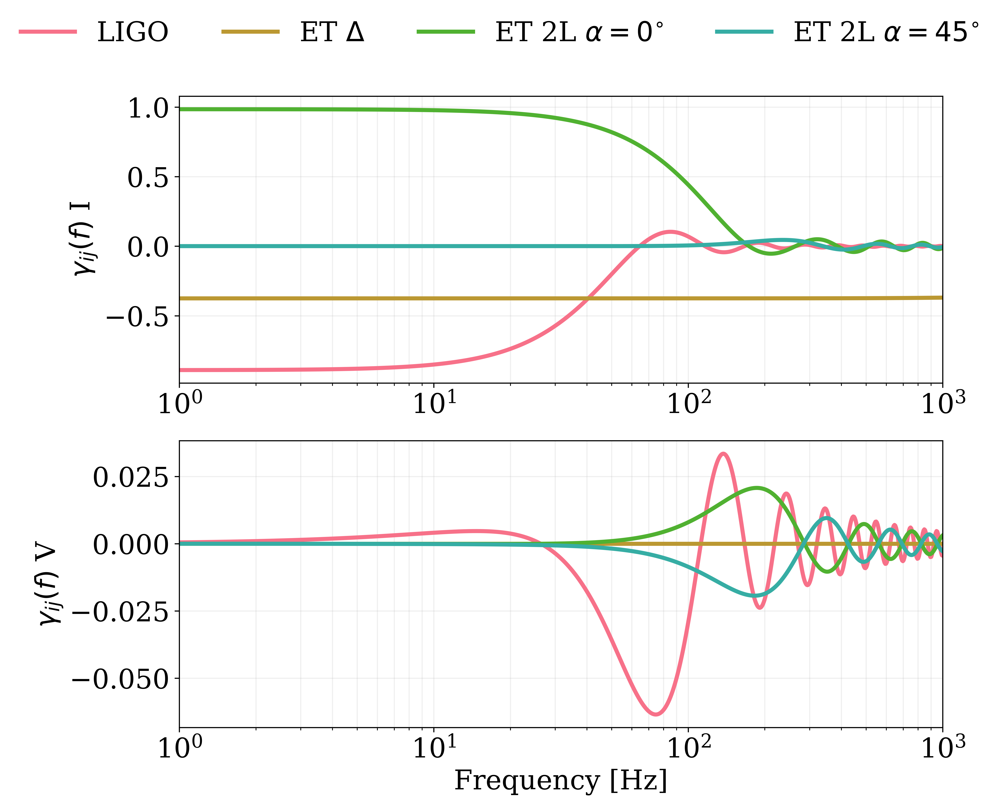

In [42]:
# example of the overlap function for the I and V stokes parameter

R_LIGO_I = Response.overlap('LIGO H', 'LIGO L', f, 0, 'I', None)
R_LIGO_V = Response.overlap('LIGO H', 'LIGO L', f, 0, 'V', None)
R_ET_I    = Response.overlap('ET X', 'ET Y', f, 0, 'I', None)
R_ET_V    = Response.overlap('ET X', 'ET Y', f, 0, 'V', None)
R_ET2L0_I = Response.overlap('ET L1', 'ET L2', f, 0, 'I', shift_angle=0)
R_ET2L0_V = Response.overlap('ET L1', 'ET L2', f, 0, 'V', shift_angle=0)
R_ET2L45_I = Response.overlap('ET L1', 'ET L2', f, 0, 'I', shift_angle=np.pi/4)
R_ET2L45_V = Response.overlap('ET L1', 'ET L2', f, 0, 'V', shift_angle=np.pi/4)

beepy.beep(sound=1) 

plt.figure(figsize=(10, 8))

plt.subplot(2, 1, 1)

plt.plot(f, R_LIGO_I, label='LIGO')
plt.plot(f, R_ET_I, label=r'ET $\Delta$')
plt.plot(f, R_ET2L0_I, label=r'ET 2L $\alpha=0^{\circ}$')
plt.plot(f, R_ET2L45_I, label=r'ET 2L $\alpha=45^{\circ}$')
plt.xscale('log')
plt.ylabel(r'$\gamma_{ij}(f)$ I')
plt.xlim(f.min(), f.max())
plt.grid(which='both', alpha=0.2)

plt.subplot(2, 1, 2)
plt.plot(f, R_LIGO_V)
plt.plot(f, R_ET_V)
plt.plot(f, R_ET2L0_V)
plt.plot(f, R_ET2L45_V)
plt.xlabel('Frequency [Hz]')
plt.xscale('log')
plt.ylabel(r'$\gamma_{ij}(f)$ V')
plt.xlim(f.min(), f.max())
plt.grid(which='both', alpha=0.2)


lines_labels = [ax.get_legend_handles_labels() for ax in plt.gcf().axes]
lines, labels = [sum(lol, []) for lol in zip(*lines_labels)]

intensity_labels = ['LIGO', r'ET $\Delta$', r'ET 2L $\alpha=0^{\circ}$', r'ET 2L $\alpha=45^{\circ}$']
filtered_lines_labels = [(line, label) for line, label in zip(lines, labels) if label in intensity_labels]

if filtered_lines_labels:
    lines, labels = zip(*filtered_lines_labels)
else:
    lines, labels = [], []

if lines and labels:
    plt.figlegend(lines, labels, loc='upper center', bbox_to_anchor=(0.5, 1.05), ncol=4, frameon=False)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

## LISA

For triangular detector, like ET and LISA, it is available to consider their combination in the AET basis. 

You can type 'ET' or 'LISA' + space + 'A', 'E', 'T'.

Invalid combination of channels are properly handled. 

* Note: we do not adopt the convention by which $\gamma_{ij}$ is normalized by $1/4\pi$ for LISA but we normalize it as all the other detectors to $5/8\pi$

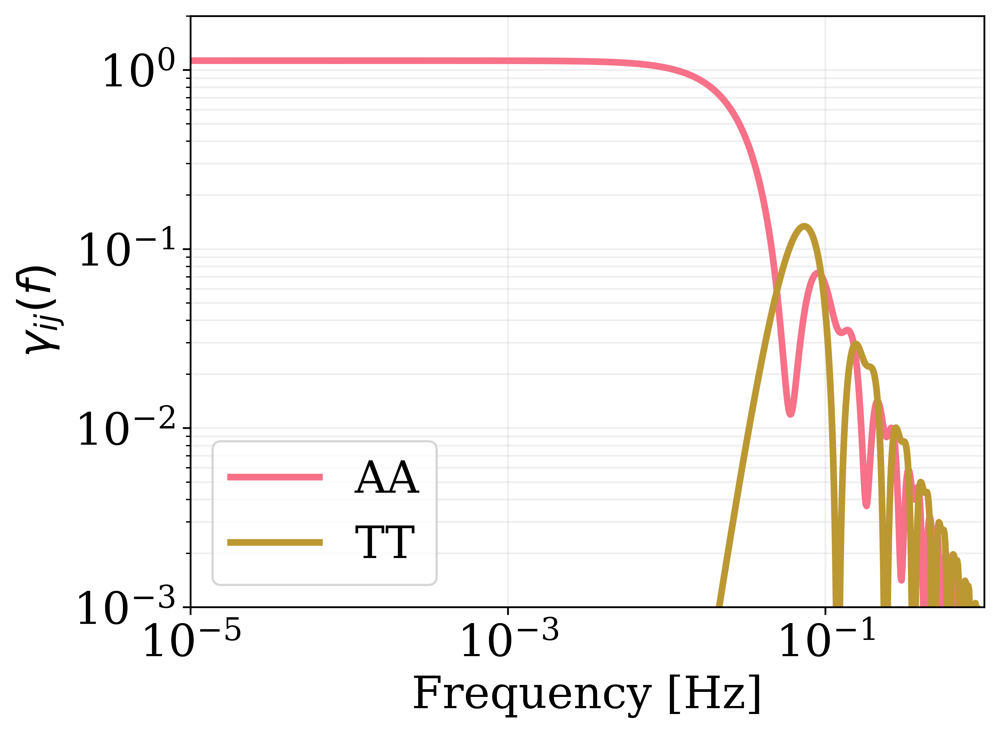

In [43]:
f_lisa = np.logspace(-5, 0, 1000)
R_AA = Response.overlap('LISA A', 'LISA A', f_lisa, 0, 't')
R_TT = Response.overlap('LISA T', 'LISA T', f_lisa, 0, 't')
beepy.beep(sound=1) 

plt.figure()
plt.plot(f_lisa, R_AA, label='AA')
plt.plot(f_lisa, R_TT, label='TT')
plt.xlabel('Frequency [Hz]')
plt.xscale('log')
plt.yscale('log')
plt.ylabel(r'$\gamma_{ij}(f)$')
plt.xlim(f_lisa.min(), f_lisa.max())
plt.ylim(1e-3, 2)
plt.grid(which='both', alpha=0.2)
plt.legend()

# Pulsar Timing Array

2025-04-13 18:11:48.712 | DEBUG    | pint.models.binary_ddk:validate:210 - Validating DDK model in ECL coordinates


[ 1095.57172259  1211.57834769  1200.64575849  4197.18116813
  1051.50466604   676.60809414  1706.23988762  2327.0737755
  1338.27149496   409.30099573   482.58202896   894.07633801
  1394.77135649  1277.71173577  1828.11047851   549.73777396
  1555.2843268   1472.598828    2166.25829548  3106.08849589
   960.51106954  1122.41374003   745.16817379   155.97552191
  2584.90180422  3997.54934584   458.93825866  1341.73108727
   345.82808458  1558.61844867  3137.25594293   982.44219603
  1517.84858692    88.40224503  2458.58005873   439.95000784
   829.99795169   418.26411547  1946.20814219  1027.60607987
 25397.27053004   288.93669346  2167.09229525   906.46347611
   978.90630556   103.0611684   1975.59173099  1249.8947686
  1318.57446809   328.69827315   627.69686186  2984.18398417
  1255.98139344  2673.46374299  1081.98786851  1050.28103689
  3746.9080344    252.63150902  1628.76442549  1986.01681513]
[ 1.09557172  1.21157835  1.20064576  4.19718117  1.05150467  0.67660809
  1.70623989 

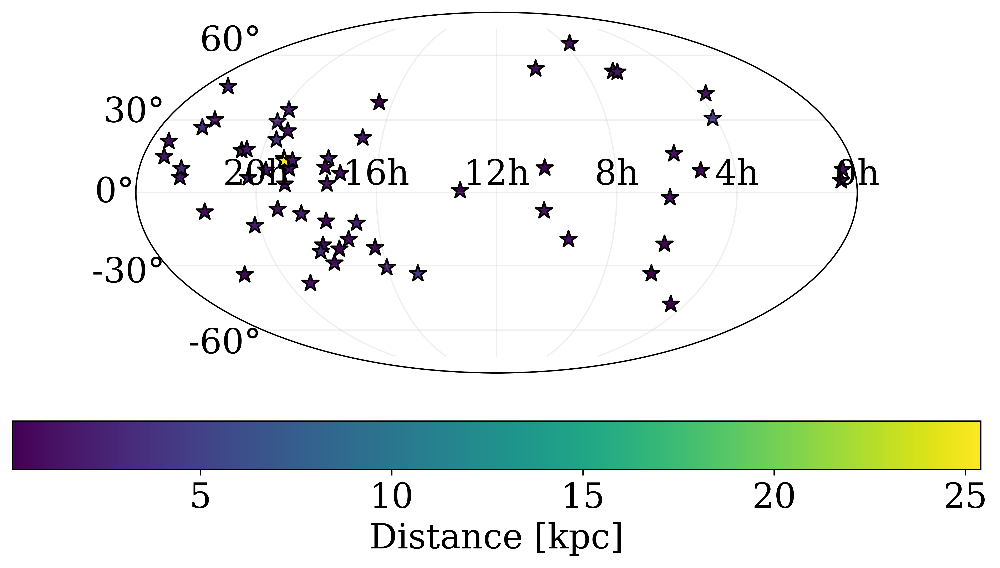

In [17]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors
import glob
from pint.models import get_model
from astropy.coordinates import SkyCoord
from astropy import units as u

# 📌 Leggere i file delle pulsar
pfiles = glob.glob(NANOGrav_dir + '/' + '*.par')

# Rimuovere pulsar specifiche (GBT e AO)
pfiles = [pf for pf in pfiles if not 'gbt' in pf and not 'ao' in pf]

# Dizionari per RA, Dec e Distanza
RA = {}   # Ascensione Retta
DEC = {}  # Declinazione
DIST = {} # Distanza in parsec

# 📌 Estrarre dati da ogni file .par
for pf in pfiles:
    m = get_model(pf)
    c = m.components['AstrometryEcliptic'].coords_as_ICRS()  # Coordinate equatoriali

    RA[m.PSR.value] = c.ra.deg 
    DEC[m.PSR.value] = c.dec.deg # Declinazione in gradi (-90, 90°)

    # Parallasse → Distanza in parsec
    if hasattr(m, 'PX') and m.PX.value > 0:  
        DIST[m.PSR.value] = 1000 / m.PX.value  
    else:
        DIST[m.PSR.value] = None  

valid_indices = [psr for psr in DIST if DIST[psr] is not None] 
# ra_vals = np.array(list(RA.values()))  
# dec_vals = np.array(list(DEC.values()))
dist_vals = np.array([DIST[psr]for psr in valid_indices])
ra_vals = np.array([RA[psr] for psr in valid_indices])
dec_vals = np.array([DEC[psr] for psr in valid_indices])

print(dist_vals)

ra_vals = np.radians(ra_vals)
dec_vals = np.radians(dec_vals)

# plt.plot(ra_vals, dec_vals, '*')
# plt.show()

# conversione radianti - gradi
ra_vals = np.degrees(ra_vals)
dec_vals = np.degrees(dec_vals)

# plt.plot(ra_vals, dec_vals, '*')
# plt.show()

# conversione RA in ore

ra_vals = ra_vals / 15
# plt.plot(ra_vals, dec_vals, '*')
# plt.show()

# fare la mappa mollweide in ore e gradi
ra_vals_deg = ra_vals * 15  # Converti RA da ore a gradi
ra_vals_rad = np.radians(ra_vals_deg)  # Converti RA in radianti
dec_vals_rad = np.radians(dec_vals)  # Converti Dec in radianti

# 📌 Correzione della proiezione Mollweide
ra_vals_rad = -ra_vals_rad + np.pi  # Inverti l'asse X per avere 0h a destra e 24h a sinistra

# 📌 Conversione delle distanze in Mpc
dist_vals_kpc = dist_vals / 1e3  # Converti da parsec (pc) a kiloparsec (kpc)

print(dist_vals_kpc)

# 📌 Creazione della figura
fig = plt.figure(figsize=(10, 5))
ax = fig.add_subplot(111, projection="mollweide")

# 📌 Scatter plot delle pulsar con il colore che rappresenta la distanza
sc = ax.scatter(ra_vals_rad, dec_vals_rad, s=100, c=dist_vals_kpc, cmap=cm.viridis, marker='*', edgecolor='black')

# 📌 Barra dei colori per le distanze in Mpc
cb = fig.colorbar(sc, orientation='horizontal', pad=0.1)
cb.set_label('Distance [kpc]')

# 📌 Configurazione asse X con etichette in ore
xticks_hours = np.array([0, 4, 8, 12, 16, 20])  # Tick in ore
xticks_rad = -np.radians(xticks_hours * 15) + np.pi  # Conversione in radianti e inversione
xticks_labels = ["0h", "4h", "8h", "12h", "16h", "20h"]
yticks = np.array([-60, -30, 0, 30, 60])  # Tick in gradi

ax.set_xticks(xticks_rad)  # Imposta i tick in radianti
ax.set_xticklabels(xticks_labels)  # Imposta le etichette
ax.set_yticks(np.radians(yticks))  # Imposta i tick in radianti

# 📌 Titolo e griglia
plt.grid(True, alpha=0.2)

# 📌 Mostra il grafico
plt.show()

2025-04-13 18:11:58.659 | DEBUG    | pint.models.binary_ddk:validate:210 - Validating DDK model in ECL coordinates


[3.38093434e+19 3.73893078e+19 3.70519281e+19 1.29525011e+20
 3.24494340e+19 2.08801258e+19 5.26545629e+19 7.18134967e+19
 4.12990583e+19 1.26310287e+19 1.48924814e+19 2.75911958e+19
 4.30426441e+19 3.94301842e+19 5.64154894e+19 1.69649077e+19
 4.79960743e+19 4.54443998e+19 6.68507310e+19 9.58538910e+19
 2.96413716e+19 3.46376880e+19 2.29958898e+19 4.81340461e+18
 7.97700697e+19 1.23364373e+20 1.41628347e+19 4.14058214e+19
 1.06722547e+19 4.80989653e+19 9.68157184e+19 3.03181662e+19
 4.68408074e+19 2.72809328e+18 7.58717806e+19 1.35768572e+19
 2.56137368e+19 1.29076306e+19 6.00599833e+19 3.17119236e+19
 7.83759769e+20 8.91658636e+18 6.68764682e+19 2.79734629e+19
 3.02090486e+19 3.18046766e+18 6.09667608e+19 3.85717526e+19
 4.06912081e+19 1.01436287e+19 1.93707252e+19 9.20919178e+19
 3.87595858e+19 8.25030911e+19 3.33901456e+19 3.24116728e+19
 1.15629582e+20 7.79620837e+18 5.02636702e+19 6.12884789e+19]


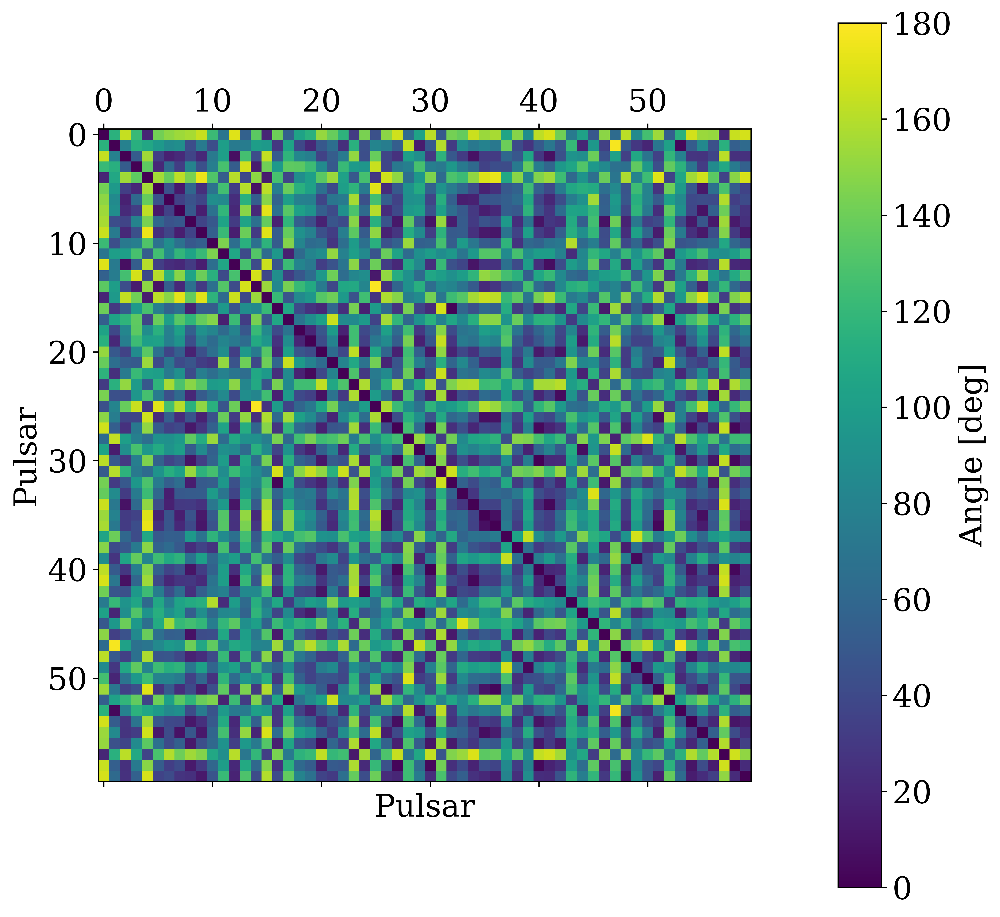

In [18]:
N_pulsar, pulsar_xyz, D = detectors.get_NANOGrav_pulsars()

print(D)

# ordina D dalla più piccola alla più grande
D = np.sort(D)

# fai un hist 2d con come colormap l'angolo tra ciascuna pulsar e l'altra

# 📌 Calcolo dell'angolo tra le pulsa
angles = np.zeros((N_pulsar, N_pulsar))
for i in range(N_pulsar):
    for j in range(N_pulsar):
        angles[i, j] = np.arccos(np.dot(pulsar_xyz[i], pulsar_xyz[j]))


# metti i nan a zero

angles[np.isnan(angles)] = 0

# 📌 Creazione della figur

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111)

# 📌 Istogramma 2D degli angoli tra le pulsa

cax = ax.matshow(np.degrees(angles), cmap=cm.viridis, norm=colors.Normalize(vmin=0, vmax=180))  

# metti le etichette    

ax.set_xlabel('Pulsar')
ax.set_ylabel('Pulsar')

# 📌 Barra dei colori per gli angol

cb = fig.colorbar(cax, orientation='vertical', pad=0.1)
cb.set_label('Angle [deg]')
plt.show()

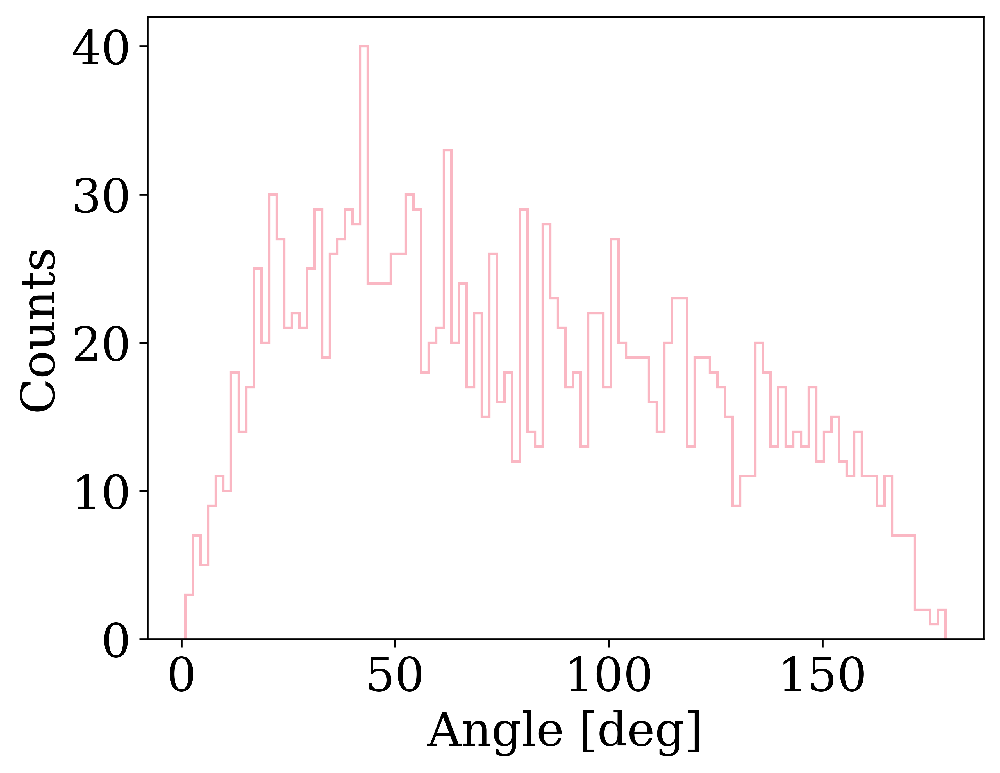

1770


In [46]:
# fai un istogramma degli angoli delle pulsar

alpha = []

for i in range(N_pulsar):
    for j in range(i+1, N_pulsar):
        alpha.append( np.degrees(angles[i, j]) )

plt.hist(alpha, bins=100, histtype='step', alpha=0.5, )
plt.xlabel('Angle [deg]')
plt.ylabel('Counts')
plt.show()

print(len(alpha))


#  The GWB energy density sensitivity spectrum :
## Power law integrated sensitivity curve


## Detectors

sens = pls.PLS(det1, det2, f, fref, pol, snr, Tobs, beta_min, beta_max, psi, shift_angle, fI=None, PnI=None, fJ=None, PnJ=None)

Evaluate the sensitivity of a pair of detectors or a network of detectors to a Gravitational Wave Background (GWB) signal.

Parameters:
- det1, det2 : str or list of str
    The names of the detectors or the network of detectors to be considered.
    Supported options are:
    - Predefined detector or detector networks such as 'ET triangular', 'LISA', or custom detectors defined as lists with specific parameters.
    - For custom detectors, provide a list with the following elements: [c, xA, xB, l, name]
        - c: array_like of length 3 (position of the detector in the Earth-centered frame in meters)
        - xA: array_like of length 3 (unit vector pointing towards the detector in the Earth-centered frame)
        - xB: array_like of length 3 (unit vector pointing towards the detector in the Earth-centered frame)
        - l: float (length of the detector arm in meters)
        - name: str (name of the detector)

- f : array_like
    Frequency values (in Hz) for the Gravitational Wave signal.
- fref : float
    Reference frequency (in Hz) for the signal analysis.
- pol : str
    Polarization of the signal. Should be one of:
    - 't' for tensor polarization
    - 'v' for vector polarization
    - 's' for scalar polarization
    - 'I' for intensity
    - 'V' for circular polarization
- snr : float
    Signal-to-noise ratio (SNR) threshold for the analysis.
- Tobs : float
    Total observation time in years.
- psi : float
    
Optional parameters:

- shift_angle : float, optional
    Shift the angle of the response if considering ET 2L in radians
- fI, PnI, fJ, PnJ : optional
    Frequency arrays and corresponding Power Spectral Densities (PSDs) for custom detectors or custom PSD.
    These are used when no predefined detector networks are chosen.

Returns:
- pls: power law sensitivity curve  (h^2 \Omega_{GW}(f))
    The sensitivity of the detector(s) to the GWB signal, evaluated as the Power-Law Sensitivity (PLS). 
    This is a function of the observation time, SNR, and the detectors' noise characteristics.

Description:
This function calculates the sensitivity of a pair of detectors or a network of detectors to a Gravitational Wave Background (GWB) signal, 
based on the given parameters. 
It evaluates the effective noise power spectral density and energy density for the signal and computes the corresponding sensitivity. 
The analysis can handle both predefined detector networks (such as LISA or ET) and custom detectors with user-supplied parameters.

- For custom detectors, the function interpolates the supplied PSDs with the frequencies given and calculates the overlap response between the detectors.
- The result is the sensitivity of the system to the GWB signal, given in terms of the Power-Law Sensitivity (PLS),
    which quantifies the detector network's ability to detect gravitational waves with the specified polarization, 
    frequency range, and observation time.


## Pulsars


Compute the power law sensitivity curve for a pulsars catalog

If you want to consider EPTA:

pls_NANOGrav = pls.PLS_PTA_EPTA(f_PTA, snr, Tobs_PTA, pol, psi)

If you want to consider NANOGrav:

pls_NANOGrav = pls.PLS_PTA_NANOGrav(f_PTA, snr, Tobs_PTA, pol, psi)



Parameters:
- f: array (frequency array)
- snr: float (signal to noise ratio threshold)
- Tobs: float (observation time in years)
- pol: str (Polarization of the signal, 't' for tensor, 'v' for vector, 's' for scalar, 'I' for intensity, 'V' for circular)
- psi: float (Polarization angle in radians)

Returns:
- pls: array [shape: len(f)] (power law sensitivity curve  (h^2 \Omega_{GW}(f))) 



2025-04-13 16:31:07.864 | DEBUG    | pint.models.binary_ddk:validate:210 - Validating DDK model in ECL coordinates


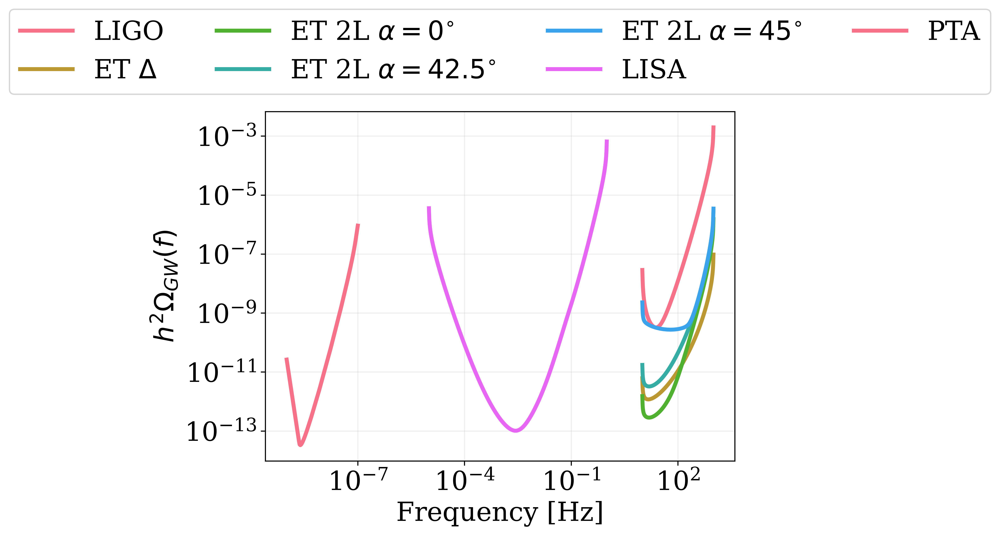

In [15]:
f = np.logspace(1, 3, 1000)
f_LISA = np.logspace(-5, 0, 1000)
f_PTA = np.logspace(-9, -7, 100)

fref = 25
fref_LISA = 1e-2
snr_ = 1
snr_LISA = 10
Tobs = 1
Tobs_LISA = 3
psi = 0
Tobs_PTA = 15

pls_LIGO = pls.PLS('LIGO H', 'LIGO L', f, fref, 't', snr_, Tobs, psi)
pls_ET = pls.PLS('ET X', 'ET Y', f, fref, 't', snr_, Tobs, psi)
pls_ET2L0 = pls.PLS('ET L1', 'ET L2', f, fref, 't', snr_, Tobs, psi, 0)
pls_ET2L425 = pls.PLS('ET L1', 'ET L2', f, fref, 't', snr_, Tobs, psi, np.deg2rad(42.5))
pls_ET2L45 = pls.PLS('ET L1', 'ET L2', f, fref, 't', snr_, Tobs, psi, np.pi/4)
pls_LISA = pls.PLS('LISA', 'Network', f_LISA, fref_LISA, 't', snr_LISA, Tobs_LISA, psi)
pls_PTA = pls.PLS_PTA(f_PTA, snr_, Tobs_PTA, 't', psi)

plt.plot(f, pls_LIGO, label='LIGO')
plt.plot(f, pls_ET, label=r'ET $\Delta$')
plt.plot(f, pls_ET2L0, label=r'ET 2L $\alpha=0^{\circ}$')
plt.plot(f, pls_ET2L425, label=r'ET 2L $\alpha=42.5^{\circ}$')
plt.plot(f, pls_ET2L45, label=r'ET 2L $\alpha=45^{\circ}$')
plt.plot(f_LISA, pls_LISA, label='LISA')
plt.plot(f_PTA, pls_PTA, label='PTA')
plt.xlabel('Frequency [Hz]')
plt.ylabel(r'$h^2 \Omega_{GW}(f)$')
plt.xscale('log')
plt.yscale('log')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1.33), ncol=4)
plt.grid(which='both', alpha=0.2)
plt.show()

beepy.beep(sound=1) 

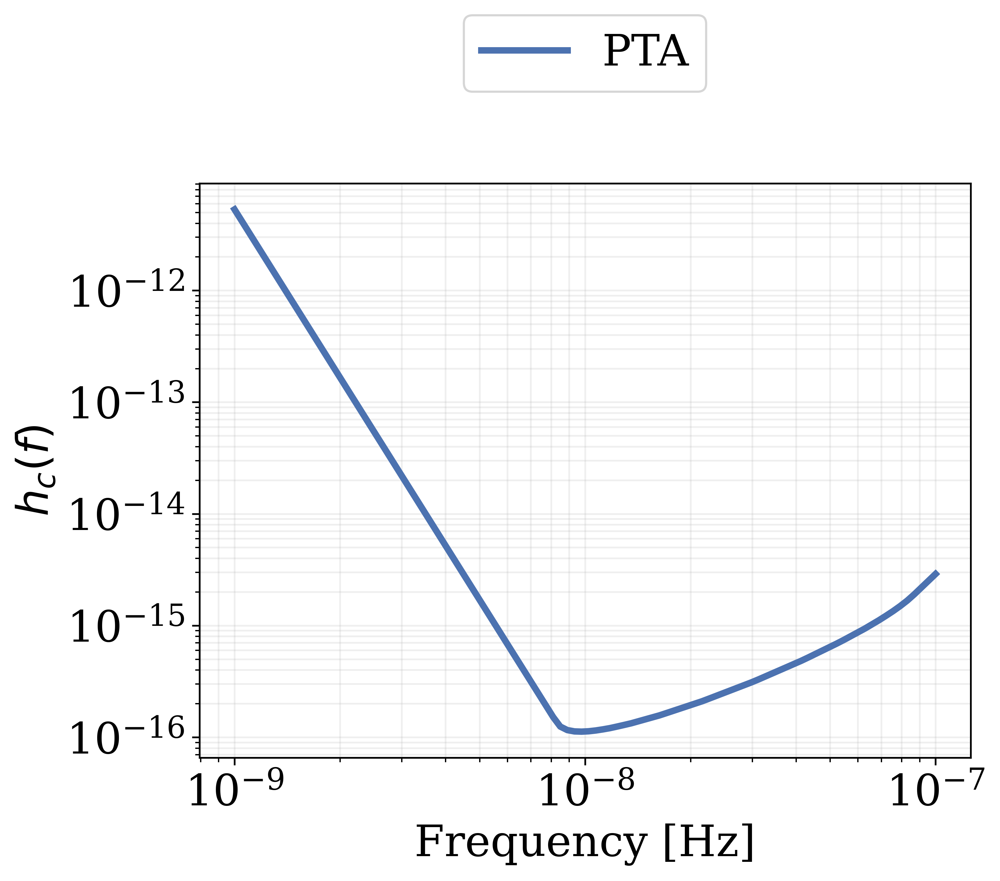

In [58]:
# conversione da Omega_GW a h_c

h_c_sens = np.sqrt(pls_PTA * 3 * H0**2 /(f_PTA**2 * 32* np.pi**2 *0.5))

plt.plot(f_PTA, h_c_sens, label='PTA')
plt.xlabel('Frequency [Hz]')
plt.ylabel(r'$h_c(f)$')
plt.xscale('log')
plt.yscale('log')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1.33), ncol=4)
plt.grid(which='both', alpha=0.2)
plt.show()

In [48]:
# fai un print della frequenza a cui si ha il minimo della pls di ET triangolare

f_ET = f[np.argmin(pls_ET)]
print('Frequenza minima PLS ET triangolare:', f_ET)

Frequenza minima PLS ET triangolare: 14.661086840469844


# SNR evaluation

In [52]:
# snr LIGO 
Tobs = 1
f = np.logspace(0, 3, 1000)
logA_gw = np.log10(pls_LIGO.min()/h**2)
fref=25
n_gw = 0
gw_params=[logA_gw, n_gw, fref]

#test with a custom function for the GW spectrum

def Omega_GW(f):
    logA_gw, n_gw, fref = gw_params
    return 10**logA_gw * (f / fref) ** n_gw

det_list = ['LIGO H', 'LIGO L']
snr_LIGO = snr.SNR(Tobs, f, None, det_list, 't', psi=0, shift_angle=None, gw_spectrum_func=Omega_GW)
print(snr_LIGO)

1.0000143138691175


In [121]:
# snr per segnali correlated noise

Tobs = 1/365
f = np.logspace(0, np.log(200), 1000)
logA_gw = -9
fref=25
n_gw = 2/3
gw_params=[logA_gw, n_gw, fref]

det_list = ['ET L1', 'ET L2']
gw_params=[logA_gw, n_gw, fref]
snr_ET2L0 = snr.SNR(Tobs, f, gw_params, det_list, 't', psi=0, shift_angle=0)
print(snr_ET2L0)


103.37824517839226


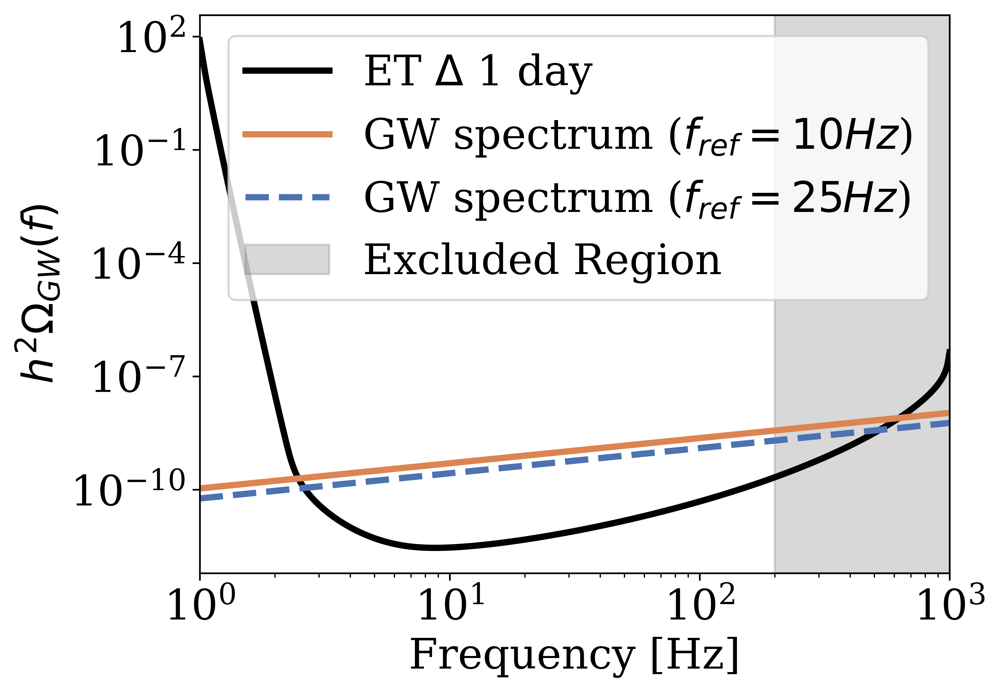

In [55]:
# plot per pls 1 day per ET e segnale

f = np.logspace(0, 3, 1000)
fref=25
snr_ = 1
psi = 0 
Tobs= 1/365
pls_1day_triangular_correlated = pls.PLS_correlated_noise(f, 25, 't', 1, 1/365, 0)

pls_ET2L0_1day = pls.PLS('ET L1', 'ET L2', f, fref, 't', snr_, 1/365, psi, 0)

gw_params_10=[-9, 2/3, 10]
gw_params_25=[-9, 2/3, 25]

def Omega_GW(f, gw_params):
    logA_gw, n_gw, fref = gw_params
    return 10**logA_gw * (f / fref) ** n_gw

Omega_10 = Omega_GW(f, gw_params_10)
Omega_25 = Omega_GW(f, gw_params_25)

sns.set_palette("deep")  # Reset della palette ai colori standard di Seaborn

plt.plot(f, pls_1day_triangular_correlated, label=r'ET $\Delta$ 1 day', color='black')
#plt.plot(f, pls_ET2L0_1day, label=r'ET 2L $\alpha=0^{\circ}$ 1 day', color='violet')
plt.plot(f, 0.5*Omega_10, label=r'GW spectrum ($f_{ref}= 10 Hz$)', color=sns.color_palette()[1])
plt.plot(f, 0.5*Omega_25, label=r'GW spectrum ($f_{ref}= 25 Hz$)', color=sns.color_palette()[0], linestyle='--')


plt.xlabel('Frequency [Hz]')
plt.ylabel(r'$h^2 \Omega_{GW}(f)$')

# add a shaded area after 200 hz vertical
plt.axvspan(200, f.max(), color='gray', alpha=0.3, label='Excluded Region')

plt.xscale('log')
plt.yscale('log')
plt.xlim(f.min(), f.max())
plt.legend()
plt.show()



In [51]:
f_ET = f[np.argmin(pls_1day_triangular_correlated)]
print('Frequenza minima PLS ET triangolare:', f_ET)

Frequenza minima PLS ET triangolare: 8.708431497690723


In [11]:
# snr ET
Tobs = 1
f = np.logspace(1, 3, 1000)
logA_gw = np.log10(pls_ET.min()/h**2)
fref=25
n_gw = 0
det_list = ['ET X', 'ET Y']
gw_params=[logA_gw, n_gw, fref]
snr_ET = snr.SNR(Tobs, f, gw_params, det_list, 't', psi=0)
print(snr_ET)

0.999795784207772


In [75]:
# snr ET 2L alpha=0
Tobs = 1/365
f = np.logspace(0, 3, 1000)
#logA_gw = np.log10(pls_ET2L0.min()/h**2)
logA_gw = -9
fref=25
n_gw = 2/3
det_list = ['ET L1', 'ET L2']
gw_params=[logA_gw, n_gw, fref]
snr_ET2L0 = snr.SNR(Tobs, f, gw_params, det_list, 't', psi=0, shift_angle=0)
print(snr_ET2L0)

# snr ET 2L alpha=45
Tobs = 1
f = np.logspace(1, 3, 1000)
logA_gw = np.log10(pls_ET2L45.min()/h**2)
fref=25
n_gw = 0
det_list = ['ET L1', 'ET L2']
gw_params=[logA_gw, n_gw, fref]
snr_ET2L45 = snr.SNR(Tobs, f, gw_params, det_list, 't', psi=0, shift_angle=np.pi/4)
print(snr_ET2L45)

AttributeError: 'int' object has no attribute 'SNR'

In [61]:
alpha = np.linspace(0, np.pi/4, 100)

snr_ = []
f = np.logspace(0, 3, 100)
logA_gw = -9
n_gw = 2/3
fref=10 # Hz
Tobs=1/365
gw_params=[logA_gw, n_gw, fref]

for a in alpha:
    snr_.append(snr.SNR(Tobs, f, gw_params,['ET L1', 'ET L2'] , 't', psi=0, shift_angle=a))


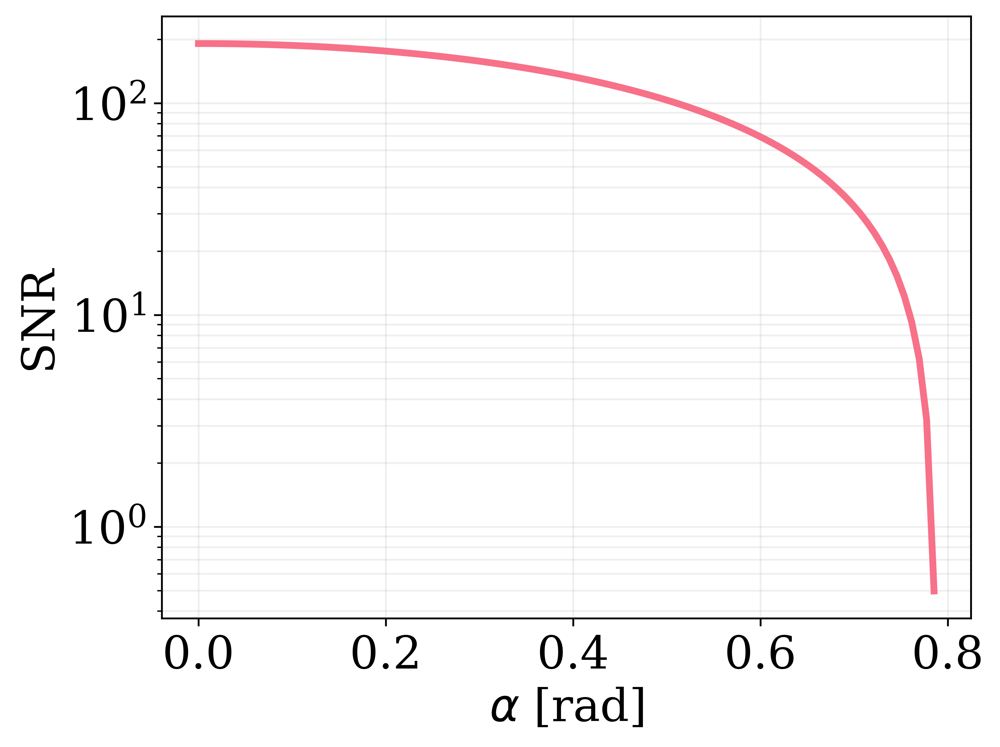

In [62]:
plt.semilogy(alpha, snr_)
plt.xlabel(r'$\alpha$ [rad]')
plt.ylabel('SNR')
plt.grid(which='both', alpha=0.2)
plt.show()

In [63]:
# snr LISA
Tobs = 3
f = np.logspace(-5, 0, 1000)
logA_gw = np.log10(pls_LISA.min()/h**2)
fref=1e-2
n_gw = 0
gw_params=[logA_gw, n_gw, fref]
snr_LISA = snr.SNR(Tobs, f, gw_params, ['LISA'], 't', psi=0, shift_angle=None)
print(snr_LISA)

9.998097290573172


In [64]:
# snr PTA
Tobs_PTA = 15
f_PTA = np.logspace(-9, -7, 100)
gw_params = [np.log10(pls_PTA.min()/h**2), 0, 1e-8]
snr_NANOGrav = snr.SNR(Tobs_PTA, f_PTA, gw_params, ['pulsars'], 't', psi=0)
print(snr_NANOGrav)

2025-03-20 11:47:52.392 | DEBUG    | pint.models.binary_ddk:validate:210 - Validating DDK model in ECL coordinates


1.0002492346132685


# Angular Response

## Detectors

Calculate the angular response of a detector to a GWB signal for a specific multipole ell.

R_ell = AngularResponse.R_ell( ell, det1, det2, f, pol, psi, shift_angle=False)

Parameters:
- ell: int positive (Multipole to consider)
- det1, det2: str or list of str
    The name of the detector(s) to consider.
    The names must be in the list of detectors available in the response module.
    The list of available detectors can be obtained by calling the function detectors.available_detectors().
    The names of the detectors are case sensitive.
    If you want to provide a custom detector, you can provide the following information in a list:

    H = [c, xA, xB, l, name]

    - c: array_like of length 3 (Position of the detector in the Earth-centered frame in meters)
    - xA: array_like of length 3 (Unit vector pointing towards the detector in the Earth-centered frame)
    - xB: array_like of length 3 (Unit vector pointing towards the detector in the Earth-centered frame)
    - l: float (Length of the arm in meters)
    - name: str (Name of the detector)

- f: array_like (Frequency in Hz)
- pol: str (Polarization of the signal, 't' for tensor, 'v' for vector, 's' for scalar, 'I' for intensity and 'V' for circular polarization)
- psi: float (Polarization angle in radians)

Optional parameters:

- shift_angle: bool or float (Shift the angle of the response if considering ET 2L in radians)


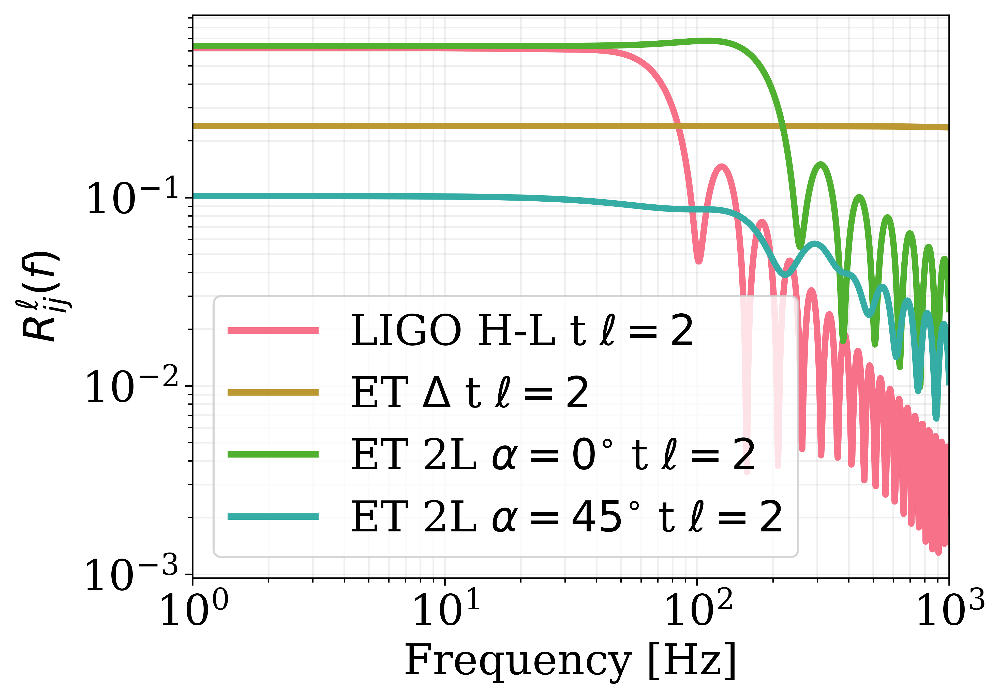

In [65]:
ell = 2
f = np.logspace(0, 3, 1000)
R2_LIGO = AngularResponse.R_ell(ell, 'LIGO H', 'LIGO L', f, 't', 0)
R2_ET = AngularResponse.R_ell(ell, 'ET X', 'ET Y', f, 't', 0)
R2_ET2L0 = AngularResponse.R_ell(ell, 'ET L1', 'ET L2', f, 't', 0, shift_angle=0)
R2_ET2L45 = AngularResponse.R_ell(ell, 'ET L1', 'ET L2', f, 't', 0, shift_angle=np.pi/4)

plt.plot(f, R2_LIGO, label=r'LIGO H-L t $\ell=2$')
plt.plot(f, R2_ET, label=r'ET $\Delta$ t $\ell=2$')
plt.plot(f, R2_ET2L0, label=r'ET 2L $\alpha=0^{\circ}$ t $\ell=2$')
plt.plot(f, R2_ET2L45, label=r'ET 2L $\alpha=45^{\circ}$ t $\ell=2$')

plt.xlabel('Frequency [Hz]')
plt.xscale('log')
plt.yscale('log')
plt.ylabel(r'$R_{ij}^{\ell}(f)$')
plt.xlim(f.min(), f.max())
plt.grid(which='both', alpha=0.2)
plt.legend()  

beepy.beep(sound=1)

## LISA AET basis

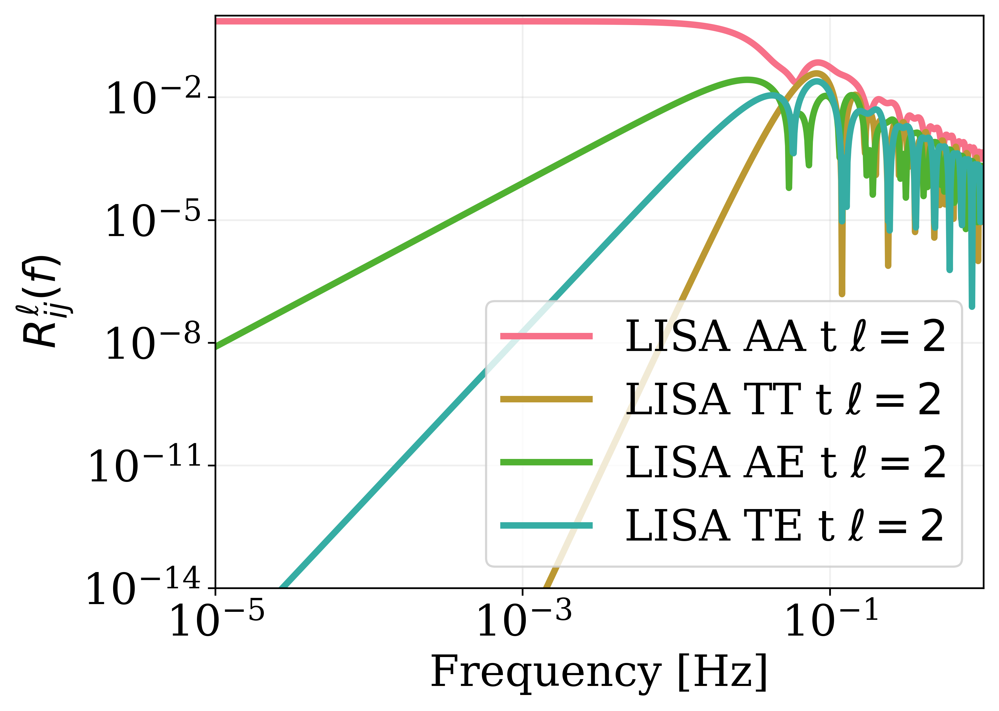

In [66]:
ell = 2
f_lisa = np.logspace(-5, 0, 1000)
R2_LISA_AA = AngularResponse.R_ell(ell,'LISA A', 'LISA A', f_lisa, 't', 0)
R2_LISA_TT = AngularResponse.R_ell(ell,'LISA T', 'LISA T', f_lisa, 't', 0)
R2_LISA_AE = AngularResponse.R_ell(ell,'LISA A', 'LISA E', f_lisa, 't', 0)
R2_LISA_TE = AngularResponse.R_ell(ell,'LISA E', 'LISA T', f_lisa, 't', 0)


plt.figure()
plt.plot(f_lisa, R2_LISA_AA, label='LISA AA t $\ell=2$')
plt.plot(f_lisa, R2_LISA_TT, label='LISA TT t $\ell=2$')
plt.plot(f_lisa, R2_LISA_AE, label='LISA AE t $\ell=2$')
plt.plot(f_lisa, R2_LISA_TE, label='LISA TE t $\ell=2$')
plt.xlabel('Frequency [Hz]')
plt.xscale('log')
plt.yscale('log')
plt.ylabel(r'$R_{ij}^{\ell}(f)$')
plt.xlim(f_lisa.min(), f_lisa.max())
plt.grid(which='both', alpha=0.2)
plt.ylim(1e-14, 1)
plt.legend()

beepy.beep(sound=1)

# Angular Power Law Sensitivity Curve

## Detectors


Evaluate the sensitivity of a couple of detector to a GWB signal for a specific multipole ell.

sens_ell = Sensitivity_ell.PLS_ell(det1, det2, ell, f, pol, psi, fref, snr, Tobs, Cl, shift_angle=None, fI=None, PnI=None, fJ=None, PnJ=None)


 https://arxiv.org/pdf/2201.08782 eq.4.42 - 4.43

Parameters:
- det1, det2 : str or list of str
    The names of the detectors or the network of detectors to be considered.
    Supported options are:
    - Predefined detector or detector networks such as 'ET triangular', 'LISA', or custom detectors defined as lists with specific parameters.
    - For custom detectors, provide a list with the following elements: [c, xA, xB, l, name]
        - c: array_like of length 3 (position of the detector in the Earth-centered frame in meters)
        - xA: array_like of length 3 (unit vector pointing towards the detector in the Earth-centered frame)
        - xB: array_like of length 3 (unit vector pointing towards the detector in the Earth-centered frame)
        - l: float (length of the detector arm in meters)
        - name: str (name of the detector)

- ell (int): Multipole moment.
- f (array): Frequency array.
- pol (float): Polarization.
- psi (float): Polarization angle.
- fref (float): Reference frequency.
- snr (float): Signal-to-noise ratio threshold.
- Tobs (float): Observation time in years.
- Cl (float): Cl parameter for multipole.
- shift_angle (float, optional): Shift angle.
- fI, PnI, fJ, PnJ (array, optional): Frequency and noise power spectral density for custom detectors.

Returns:
- pls (array_like): power law sensitivity curve  (h^2 \Omega_{GW}(f))


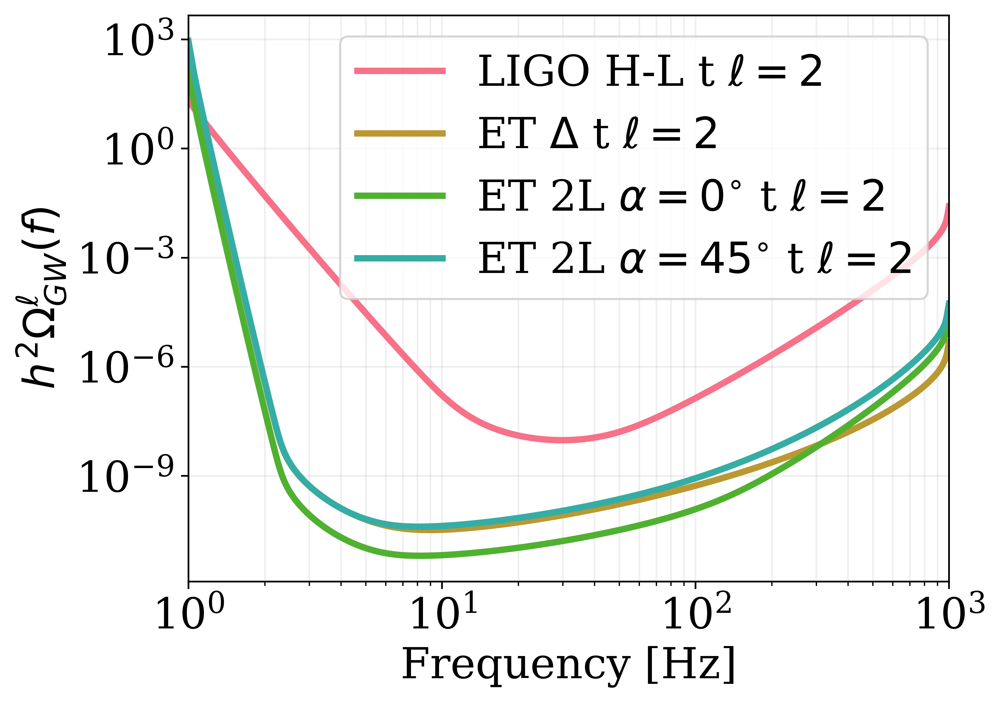

In [67]:
Cl = 1e-3
l=2
Tobs = 1
fref = 10
snr = 1

f = np.logspace(0, 3, 1000)
pls2_LIGO = Sensitivity_ell.PLS_ell('LIGO H', 'LIGO L', l, f, 't', 0, fref, snr, Tobs, Cl)
pls2_ET = Sensitivity_ell.PLS_ell('ET X', 'ET Y', l, f, 't', 0, fref,  snr, Tobs,  Cl)
pls2_ET2L0 = Sensitivity_ell.PLS_ell('ET L1', 'ET L2', l, f, 't', 0,  fref, snr, Tobs, Cl, 0)
pls2_ET2L45 = Sensitivity_ell.PLS_ell('ET L1', 'ET L2', l, f, 't', 0,  fref, snr, Tobs,  Cl, np.pi/4)

plt.plot(f, pls2_LIGO, label=r'LIGO H-L t $\ell=2$')
plt.plot(f, pls2_ET, label=r'ET $\Delta$ t $\ell=2$')
plt.plot(f, pls2_ET2L0, label=r'ET 2L $\alpha=0^{\circ}$ t $\ell=2$')
plt.plot(f, pls2_ET2L45, label=r'ET 2L $\alpha=45^{\circ}$ t $\ell=2$')
plt.xlabel('Frequency [Hz]')
plt.xscale('log')
plt.yscale('log')
plt.ylabel(r'$h^2 \Omega_{GW}^{\ell}(f)$')
plt.xlim(f.min(), f.max())
plt.grid(which='both', alpha=0.2)
plt.legend()

beepy.beep(sound=1)

## LISA

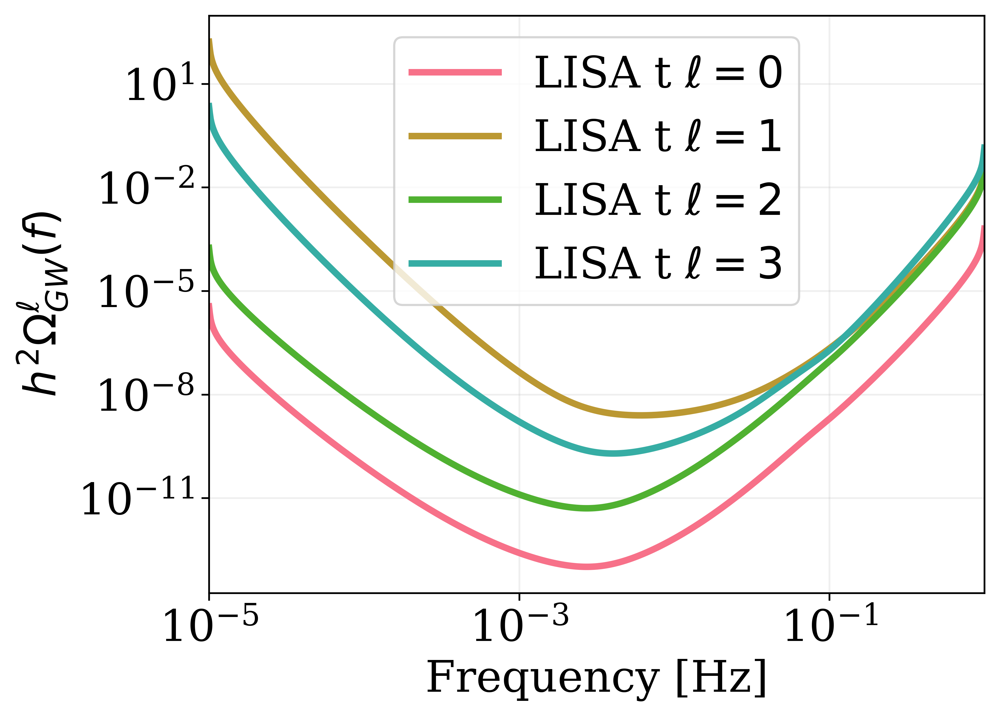

In [68]:
Tobs = 3
snr = 10
f_lisa = np.logspace(-5, 0, 1000)
pls0_LISA = Sensitivity_ell.PLS_ell('LISA', 'Network', 0, f_lisa, 't', 0, 1e-2, snr, Tobs, 1)
pls1_LISA = Sensitivity_ell.PLS_ell('LISA', 'Network', 1, f_lisa, 't', 0, 1e-2, snr, Tobs, 1e-3)
pls2_LISA = Sensitivity_ell.PLS_ell('LISA', 'Network', 2, f_lisa, 't', 0, 1e-2, snr, Tobs, 1e-3)
pls3_LISA = Sensitivity_ell.PLS_ell('LISA', 'Network', 3, f_lisa, 't', 0, 1e-2, snr, Tobs, 1e-3)

plt.figure()
plt.plot(f_lisa, pls0_LISA, label='LISA t $\ell=0$')
plt.plot(f_lisa, pls1_LISA, label='LISA t $\ell=1$')
plt.plot(f_lisa, pls2_LISA, label='LISA t $\ell=2$')
plt.plot(f_lisa, pls3_LISA, label='LISA t $\ell=3$')
plt.xlabel('Frequency [Hz]')
plt.xscale('log')
plt.yscale('log')
plt.ylabel(r'$h^2 \Omega_{GW}^{\ell}(f)$')
plt.xlim(f_lisa.min(), f_lisa.max())
plt.grid(which='both', alpha=0.2)
plt.legend()

beepy.beep(sound=1)

# Pulsar Timing Array

2025-03-20 11:55:27.231 | DEBUG    | pint.models.binary_ddk:validate:210 - Validating DDK model in ECL coordinates
2025-03-20 11:55:39.414 | DEBUG    | pint.models.binary_ddk:validate:210 - Validating DDK model in ECL coordinates
2025-03-20 11:55:51.448 | DEBUG    | pint.models.binary_ddk:validate:210 - Validating DDK model in ECL coordinates


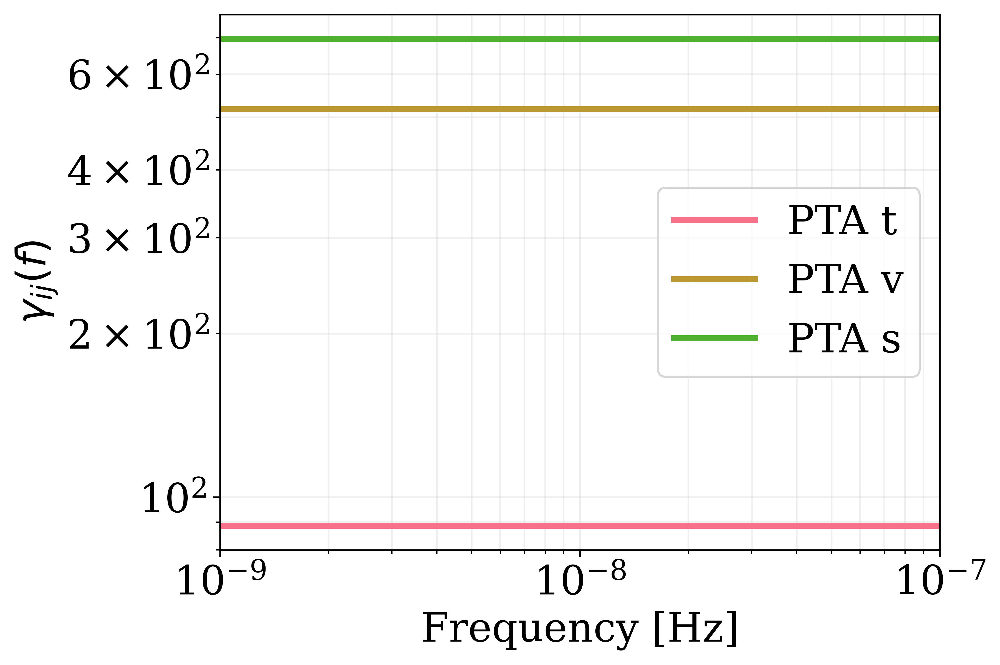

In [69]:
f = np.logspace(-9, -7, 100)
overlap_t_PTA = Response.overlap_PTA(f, 't')
overlap_v_PTA = Response.overlap_PTA(f, 'v')
overlap_s_PTA = Response.overlap_PTA(f, 's')

plt.plot(f, overlap_t_PTA, label='PTA t')
plt.plot(f, overlap_v_PTA, label='PTA v')
plt.plot(f, overlap_s_PTA, label='PTA s')
plt.xlabel('Frequency [Hz]')
plt.xscale('log')
plt.yscale('log')
plt.ylabel(r'$\gamma_{ij}(f)$')
plt.xlim(f.min(), f.max())
plt.grid(which='both', alpha=0.2)
plt.legend()

beepy.beep(sound=1)

Angular PLS

2025-03-20 11:56:04.692 | DEBUG    | pint.models.binary_ddk:validate:210 - Validating DDK model in ECL coordinates
2025-03-20 11:56:17.321 | DEBUG    | pint.models.binary_ddk:validate:210 - Validating DDK model in ECL coordinates


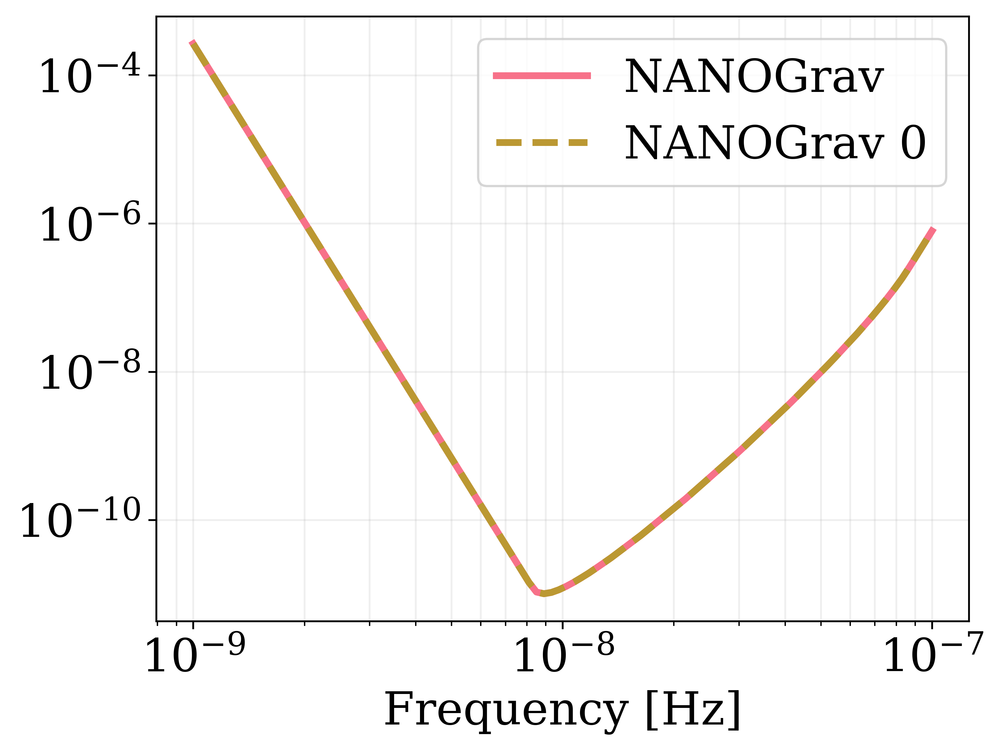

In [70]:
# check with the monopole
f = np.logspace(-9, -7, 100)
snr = 1
Tobs = 20
psi=0

pls_NANOGrav = pls.PLS_PTA(f, snr, Tobs, 't', psi)
pls_NANOGrav_0 = Sensitivity_ell.PLS_ell_PTA(0, f, snr, Tobs, 1, 't', psi)

plt.loglog(f, pls_NANOGrav, label='NANOGrav')
plt.loglog(f, pls_NANOGrav, label='NANOGrav 0', linestyle='--')
plt.xlabel('Frequency [Hz]')
plt.legend()
plt.grid(which='both', alpha=0.2)
plt.show()

In [71]:
print(np.min(pls_NANOGrav))

1.0062053943971102e-11


2025-03-20 11:56:48.805 | DEBUG    | pint.models.binary_ddk:validate:210 - Validating DDK model in ECL coordinates
2025-03-20 11:57:20.293 | DEBUG    | pint.models.binary_ddk:validate:210 - Validating DDK model in ECL coordinates
2025-03-20 11:58:40.781 | DEBUG    | pint.models.binary_ddk:validate:210 - Validating DDK model in ECL coordinates
2025-03-20 12:00:51.582 | DEBUG    | pint.models.binary_ddk:validate:210 - Validating DDK model in ECL coordinates
2025-03-20 12:03:56.513 | DEBUG    | pint.models.binary_ddk:validate:210 - Validating DDK model in ECL coordinates


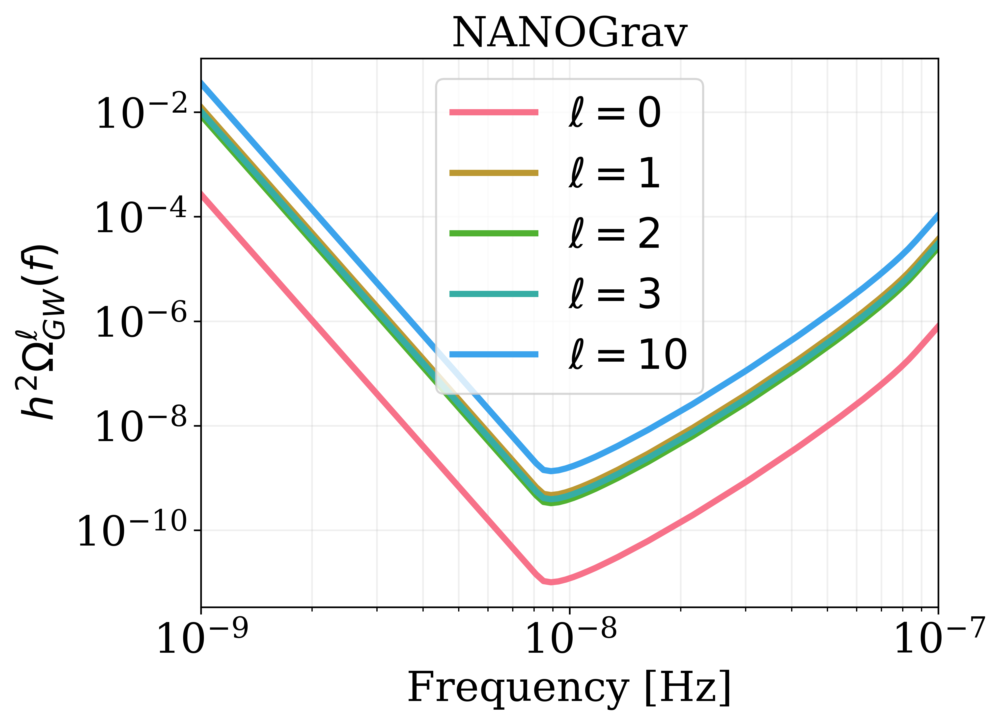

In [72]:
f = np.logspace(-9, -7, 100)
snr = 1
Tobs = 20
psi=0

pls_NANOGrav_0 = Sensitivity_ell.PLS_ell_PTA(0, f, snr, Tobs, 1, 't', psi)
pls_NANOGrav_1 = Sensitivity_ell.PLS_ell_PTA(1, f, snr, Tobs, 1e-3, 't', psi)
pls_NANOGrav_2 = Sensitivity_ell.PLS_ell_PTA(2, f, snr, Tobs, 1e-3, 't', psi)
pls_NANOGrav_3 = Sensitivity_ell.PLS_ell_PTA(3, f, snr, Tobs, 1e-3, 't', psi)

pls_NANOGrav_10 = Sensitivity_ell.PLS_ell_PTA(10, f, snr, Tobs, 1e-3, 't', psi)

plt.loglog(f, pls_NANOGrav_0, label=r'$\ell=0$')
plt.loglog(f, pls_NANOGrav_1, label=r'$\ell=1$')
plt.loglog(f, pls_NANOGrav_2, label=r'$\ell=2$')
plt.loglog(f, pls_NANOGrav_3, label=r'$\ell=3$')
plt.loglog(f, pls_NANOGrav_10, label=r'$\ell=10$')
plt.xlabel('Frequency [Hz]')
plt.ylabel(r'$h^2 \Omega_{GW}^{\ell}(f)$')
plt.xlim(f.min(), f.max())
plt.legend()
plt.title('NANOGrav')
plt.grid(which='both', alpha=0.2)

In [73]:
print(np.min(pls_NANOGrav_0))
print(np.min(pls_NANOGrav_1))
print(np.min(pls_NANOGrav_2))
print(np.min(pls_NANOGrav_3))

1.0062053943971106e-11
4.697716817075376e-10
3.2877088968145955e-10
3.905641875648467e-10


In [63]:
s = 1/(8e-9)
print(1/(8e-9))
# convert it in years
yr = s/(60*60*24*365.25)
print(yr)


124999999.99999999
3.9610109767536184


In [64]:
# calcola un anno in Hz
yr = 1/(60*60*24*365.25)
print(yr)

3.168808781402895e-08


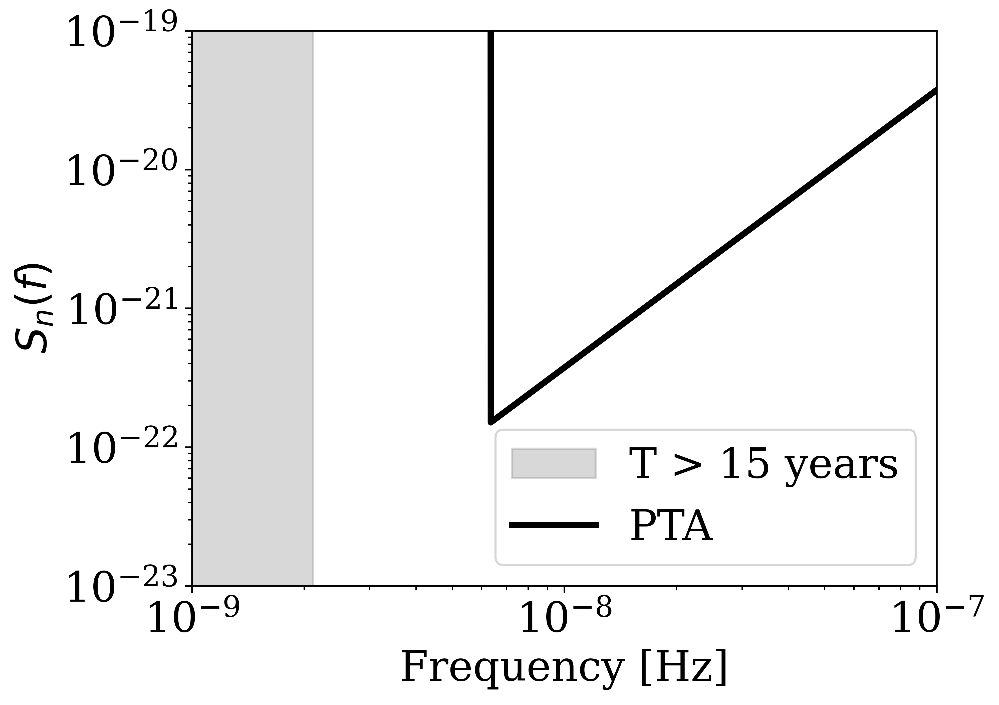

In [12]:
def PTA_Pn():
    DT = (365*24*3600)/20 # s
    s = 100 * 1e-9 #s
    return 2* (s**2) * DT

def PTA_Sn(f):
    f = np.asarray(f) # Ensure f is a NumPy array
    Tobs = 5 # yrs
    mask = f>= 1/(365*24*60*60*Tobs)
    return np.where(mask, PTA_Pn() * 12 * (np.pi**2) * f**2, 1) # Apply the mask to the result

f = np.logspace(-9, -7, 1000)

Sn = PTA_Sn(f)

T_15_years = 15 * 365 * 24 * 3600  # in s
f_15_years = 1 / T_15_years  # in Hz
plt.axvspan(f.min(), f_15_years, color='gray', alpha=0.3, label='T > 15 years')
plt.plot(f, Sn, label='PTA', color='black')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Frequency [Hz]')
plt.ylabel(r'$S_n(f)$')
plt.xlim(f.min(), f.max())
plt.ylim(1e-23, 1e-19)
plt.legend()


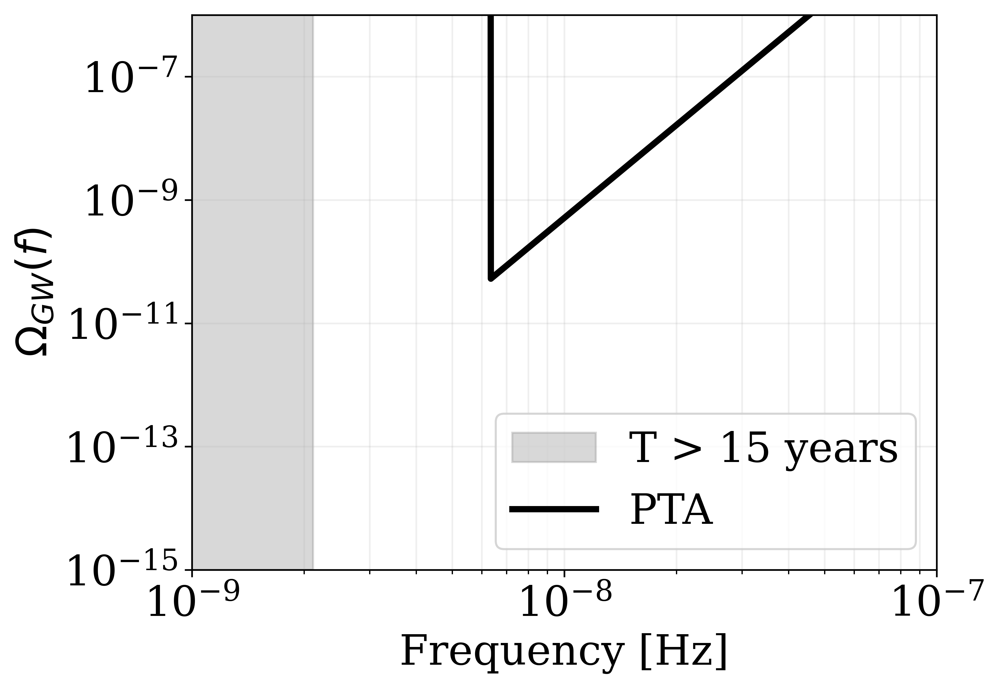

In [13]:
Omega_Sn = Sn * 2 * np.pi**2 * f**3 /(3* H0**2)

plt.axvspan(f.min(), f_15_years, color='gray', alpha=0.3, label='T > 15 years')
plt.plot(f, Omega_Sn, label='PTA', color='black')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Frequency [Hz]')
plt.ylabel(r'$\Omega_{GW}(f)$')
plt.xlim(f.min(), f.max())
plt.ylim(1e-15, 1e-6)
plt.legend()
plt.grid(which='both', alpha=0.2)